Name : Akash Khamkar<br>
akashskhamkar99@gmail.com

In [150]:
import numpy as np
import csv
import time
from barbar import Bar
from PIL import Image
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.backends.cudnn as cudnn
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch.utils.data.dataset import random_split
import cv2 as cv

import sklearn.metrics as metrics
from sklearn.metrics import roc_auc_score

In [151]:
use_gpu = torch.cuda.is_available()
use_gpu

True

In [3]:
TrainFilePATH = 'train.csv'
ValidFilePATH = 'valid.csv'

<h2>Creating Dataset

In [4]:
class BuildDataset(Dataset):
    def __init__(self, data_PATH, transform = None):
        #create som empty lists
        image_names = []
        labels = []
        #opening the csv files
        with open(data_PATH, "r") as f:
            csvReader = csv.reader(f)
            next(csvReader, None) # skip the header
            for line in csvReader:
                #the 1st column in csv is image name and path so saving it in list image_name
                image_name = line[0]
                #From column no.6 onwards the label class start so save them
                label = line[5:]
                #this for loop iterates over all the 14 classes and saves their values
                for i in range(14):
                    if label[i]:
                        a = float(label[i])
                        if a == 1:
                            label[i] = 1
                            #here the policy of ones is used so changing uncertain to 1 (i.e. binary mapping)
                        elif a == -1:
                            label[i] = 1
                        else:
                            label[i] = 0
                    else:
                        label[i] = 0
                #append the values after each iteration to the list 
                image_names.append('./' + image_name)
                labels.append(label)

        self.image_names = image_names
        self.labels = labels
        self.transform = transform
    
    #for returning image along with their label for display purposes
    def __getitem__(self, index):
        
        image_name = self.image_names[index]
        image = Image.open(image_name).convert('RGB')
        label = self.labels[index]
        if self.transform is not None:
            image = self.transform(image)
        return image, torch.FloatTensor(label)

    #for returning length of dataset when required
    def __len__(self):
        return len(self.image_names)
    

<h2>Normalize the data and doing transformations</h2> 

In [5]:
#using mean and standard deviation of imagenet to normalize the images 
normalize = transforms.Normalize((0.485, 0.456, 0.406),(0.229, 0.224, 0.225))
transforms_list = []
transforms_list.append(transforms.Resize((224,224)))
transforms_list.append(transforms.ToTensor())
transformSeq = transforms.Compose(transforms_list)

In [6]:
dataset = BuildDataset(TrainFilePATH, transformSeq)
validationset = BuildDataset(ValidFilePATH, transformSeq)

In [21]:
class_names = ['No Finding', 'Enlarged Cardiomediastinum', 'Cardiomegaly', 'Lung Opacity', 
               'Lung Lesion', 'Edema', 'Consolidation', 'Pneumonia', 'Atelectasis', 'Pneumothorax', 
               'Pleural Effusion', 'Pleural Other', 'Fracture', 'Support Devices']

In [7]:
print(len(dataset))

223414


In [8]:
print(len(validationset))

234


<h2>using 10 % of the dataset</h2>

In [9]:
train_ratio = 0.1
train_no = round(len(dataset) * train_ratio)

datasetTrain, x = random_split(dataset, [train_no, len(dataset) - train_no])
print(len(datasetTrain))
datasetTest, x = random_split(x, [500, len(x) - 500])
print(len(datasetTest))


22341
500


In [10]:
Train = DataLoader(dataset=datasetTrain, batch_size=32, shuffle=True, pin_memory=True)
Val = DataLoader(dataset=validationset, batch_size=32, shuffle=False, pin_memory=True)
Test = DataLoader(dataset=datasetTest, pin_memory=True)

<h2>How training Images Looks with their labels</h2>


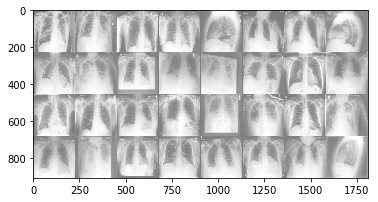

tensor([[0., 0., 0., 1., 0., 0., 0., 0., 1., 1., 0., 0., 0., 1.],
        [0., 0., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0.],
        [0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 1., 0., 0., 0.],
        [0., 0., 0., 1., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.],
        [0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.],
        [0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 1., 0., 0., 1.],
        [0., 0., 1., 1., 0., 1., 0., 0., 0., 0., 1., 0., 0., 1.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.],
        [0

In [11]:
def imshow(img):
    img = img / 2 + 0.5 
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()
    
dataiter = iter(Train)
images, labels = dataiter.next()

imshow(torchvision.utils.make_grid(images)) 
print(labels)

<h2> This is what one of the test image looks like and its label</h2>

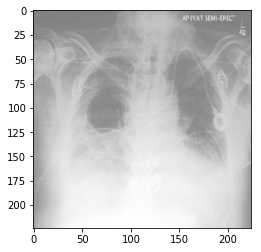

tensor([[0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 0., 1.]])


In [12]:
dataiter = iter(Test)
images, labels = dataiter.next()

imshow(torchvision.utils.make_grid(images)) 
print(labels)

<h2>Setting Max no. of epochs and Classcount </h2>


In [13]:
maxepoch = 3
classcount = 14

<h2>Creating a Class to define per epoch process for training and validation</h2>

In [14]:
class PerEpoch():
    def train_epoch(model, traindata, optimizer, loss, maxepoch, classcount):
        train_loss = 0
        model.train()
        for batchno, (varinput, target) in enumerate(Bar(traindata)):
            #assign target to CUDA
            vartarget = target.cuda(non_blocking = True)
            #get output
            varoutput = model(varinput)
            #calculate loss value...
            tloss = loss(varoutput, vartarget)
            #clear gradients
            optimizer.zero_grad()
            #claculate gradients
            tloss.backward()
            #update parameters
            optimizer.step()
            train_loss += tloss.item()
        train_loss = train_loss / len(traindata)
        #print("this is train loss for per epoch: ",train_loss)
        return train_loss
        
    def val_epoch(model, valdata, optimizer, loss, maxepoch, classcount):
        model.eval()
        val_loss = 0
        #Drop Gradient Calculation
        with torch.no_grad():
            for n, (varinput, target) in enumerate(Bar(valdata)):
                #assign target to CUDA
                target = target.cuda(non_blocking = True)
                #get output
                varoutput = model(varinput)
                #calculate loss value...
                val_loss += loss(varoutput, target)
        return val_loss / len(valdata)
    

<h2>Class for Training and Validation</h2>


In [15]:
class train_validation():
    def train(model, traindata, valdata, classcount, maxepoch):
        #set optimizer
        optimizer = optim.Adam(model.parameters(), lr=0.0001)
        #set loss function
        loss = torch.nn.BCELoss()
        
        #timing the network and start training....
        min_loss = 10000
        time_start = []
        time_end = []
        for epoch in range(0, maxepoch):
            time_start.append(time.time())
            #find training loss..
            tloss = PerEpoch.train_epoch(model, traindata, optimizer, loss, maxepoch, classcount)
            time_end.append(time.time())
            #find validation loss..
            vloss = PerEpoch.val_epoch(model, valdata, optimizer, loss, maxepoch, classcount)
            print("Training loss: {:.4f},".format(tloss), "Valid loss: {:.3f}".format(vloss))
            #If the vloss is less than min_loss then save the values:
            if vloss < min_loss:
                min_loss = vloss
                #saving epochno.,model_state, loss, optimizer
                torch.save({'epoch': epoch + 1, 'state_dict': model.state_dict(), 
                            'best_loss': min_loss, 'optimizer' : optimizer.state_dict()}, 
                           'm-epoch' + str(epoch) + '.pth.tar')
                print('Epoch ' + str(epoch + 1) + ' values saved -- Loss = ' + str(vloss))
            else:
                print('Epoch ' + str(epoch + 1) + ' -- Loss = ' + str(vloss))
        total_time = np.array(time_end) - np.array(time_start)
        return total_time

<h2>Class for Testing the model</h2>

In [16]:
class testmodel():
    def test(model, testdata, classcount, checkpoint):
        #use benchmark mode to autoselect best algo for hardware
        cudnn.benchmark = True
        #load the previously saved checkpint
        model_checkpoint = torch.load(checkpoint)
        #load model.state_dictionary
        model.load_state_dict(model_checkpoint['state_dict'])
        #assign realoutput and predictedoutput to cuda 
        rout = torch.FloatTensor().cuda()
        pout = torch.FloatTensor().cuda()
        model.eval()
        weights = list(model.module.densenet121.features.parameters())[-2]
        #drop gradient calculation
        with torch.no_grad():
            for i, (input, target) in enumerate(Bar(testdata)):
                #assign target to cuda
                target = target.cuda()
                #concatinating all real outputs to rout
                rout = torch.cat((rout, target), 0).cuda()
                #getting batchsize, channel, height, width form input
                bs, c, h, w = input.size()
                #creating a view of input to varInput helps for fast and efficient element wise operations 
                varInput = input.view(-1, c, h, w)
                out = model(varInput)
                #concatinating all predicted outputs to pout
                pout = torch.cat((pout, out), 0)
                
        return rout, pout
        

<h2>Defining the Pretrained DenseNet121 model with an additional classifier layer</h2>

In [17]:
class DenseNet121(nn.Module):
    def __init__(self, out_size):
        super(DenseNet121, self).__init__()
        self.densenet121 = torchvision.models.densenet121(pretrained=True)
        
        num_ftrs = self.densenet121.classifier.in_features
        self.densenet121.classifier = nn.Sequential(
            nn.Linear(num_ftrs, out_size),
        nn.Sigmoid()
        )
        
    def forward(self, x):
        x = self.densenet121(x)
        return x

In [18]:
#Initialise and load the model
model = DenseNet121(classcount).cuda()
#using nn.DataParallel to enable parallel processing on gpu
model = torch.nn.DataParallel(model).cuda()

In [19]:
start = time.time()
train = train_validation.train(model, Train, Val, classcount, maxepoch)
end = time.time()
print("Model Trained")

22341/22341: [===============================>] - ETA 3.1ssss
234/234: [============================>...] - ETA 0.2s
Training loss: 0.3864, Valid loss: 0.372
Epoch 1 values saved -- Loss = tensor(0.3725, device='cuda:0')
22341/22341: [===============================>] - ETA 2.1ssss
234/234: [============================>...] - ETA 0.2s
Training loss: 0.3508, Valid loss: 0.370
Epoch 2 values saved -- Loss = tensor(0.3696, device='cuda:0')
22341/22341: [===============================>] - ETA 1.3sss
234/234: [============================>...] - ETA 0.2s
Training loss: 0.3284, Valid loss: 0.354
Epoch 3 values saved -- Loss = tensor(0.3538, device='cuda:0')
Model Trained


In [20]:
rout, pout = testmodel.test(model, Test, classcount, "m-epoch2.pth.tar")

500/500: [===============================>] - ETA 0.8sss


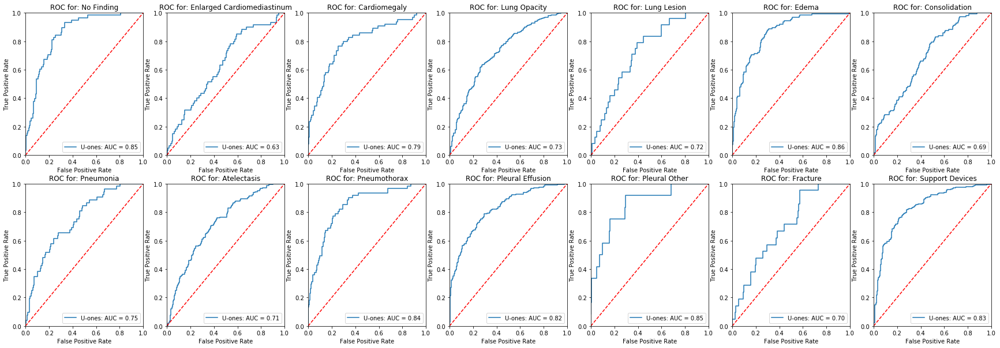

In [38]:
for i in range(classcount):
    fpr, tpr, threshold = metrics.roc_curve(rout.cpu()[:,i], pout.cpu()[:,i])
    roc_auc = metrics.auc(fpr, tpr)
    f = plt.subplot(2, 7, i+1)

    plt.title('ROC for: ' + class_names[i])
    plt.plot(fpr, tpr, label = 'U-ones: AUC = %0.2f' % roc_auc)

    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')

fig_size = plt.rcParams["figure.figsize"]
plt.rcParams["figure.figsize"] = (30, 10)

plt.savefig("ROC.png", dpi = 300)
plt.show()

In [147]:
model = DenseNet121(classcount).cuda()
model = torch.nn.DataParallel(model).cuda()
modelCheckpoint = torch.load(pathModel)
model.load_state_dict(modelCheckpoint['state_dict'])

t1, t2, t3 = [], [], []
t1_handle = model.module.densenet121.features.transition1.conv.register_forward_hook(lambda module, in_tensor, out_tensor: t1.append(out_tensor))
t2_handle = model.module.densenet121.features.transition1.conv.register_forward_hook(lambda module, in_tensor, out_tensor: t2.append(out_tensor))
t3_handle = model.module.densenet121.features.transition1.conv.register_forward_hook(lambda module, in_tensor, out_tensor: t3.append(out_tensor))

# backward hooks
bt1, bt2, bt3 = [], [], []
bt1_handle = model.module.densenet121.features.transition1.conv.register_backward_hook(lambda module, in_tensor, out_tensor: bt1.append(in_tensor))
bt2_handle = model.module.densenet121.features.transition1.conv.register_backward_hook(lambda module, in_tensor, out_tensor: bt2.append(in_tensor))
bt3_handle = model.module.densenet121.features.transition1.conv.register_backward_hook(lambda module, in_tensor, out_tensor: bt3.append(in_tensor))

In [148]:
x = next(iter(Test))[0][0:1]  # first example only
out = model(x).cpu()

In [152]:
def visualize(features):
    fig, axs = plt.subplots(len(features)//12,12,figsize=(2*12,2*len(features)//12))
    for i, ax in enumerate(axs.flatten()):
        ax.imshow(features[i].detach().cpu().abs())
        ax.axis('off')

<h1>Visualize Features for Transition Layers 1,2,3</h1>

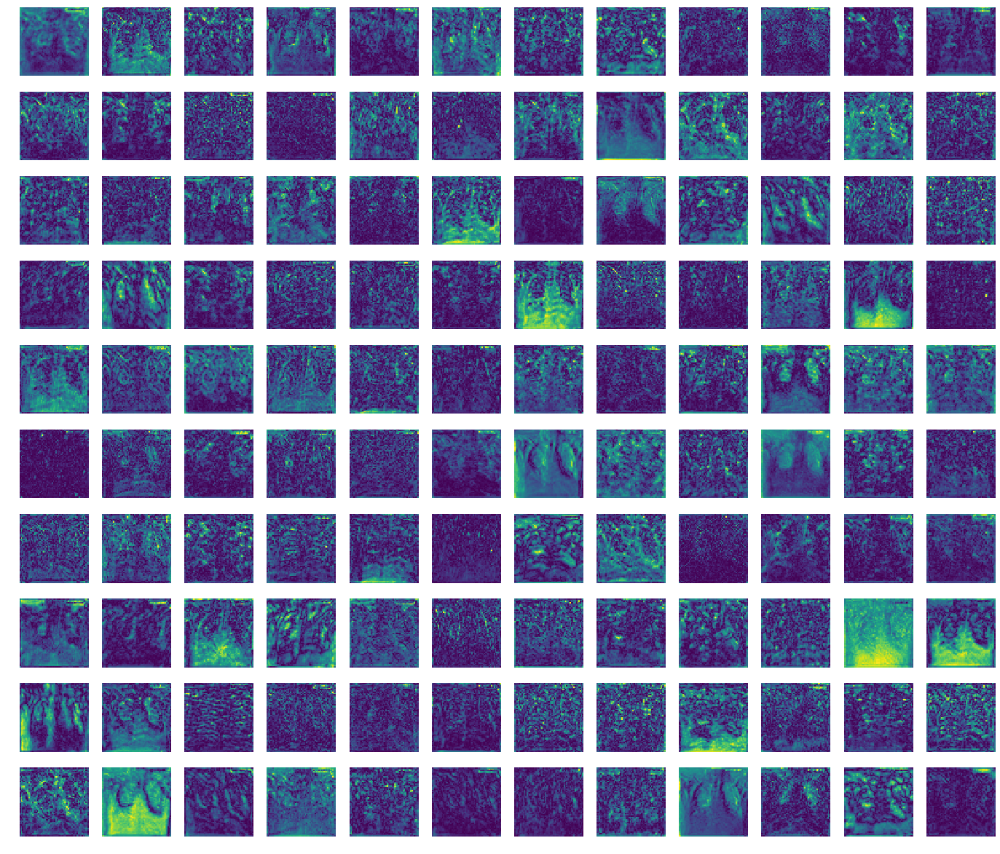

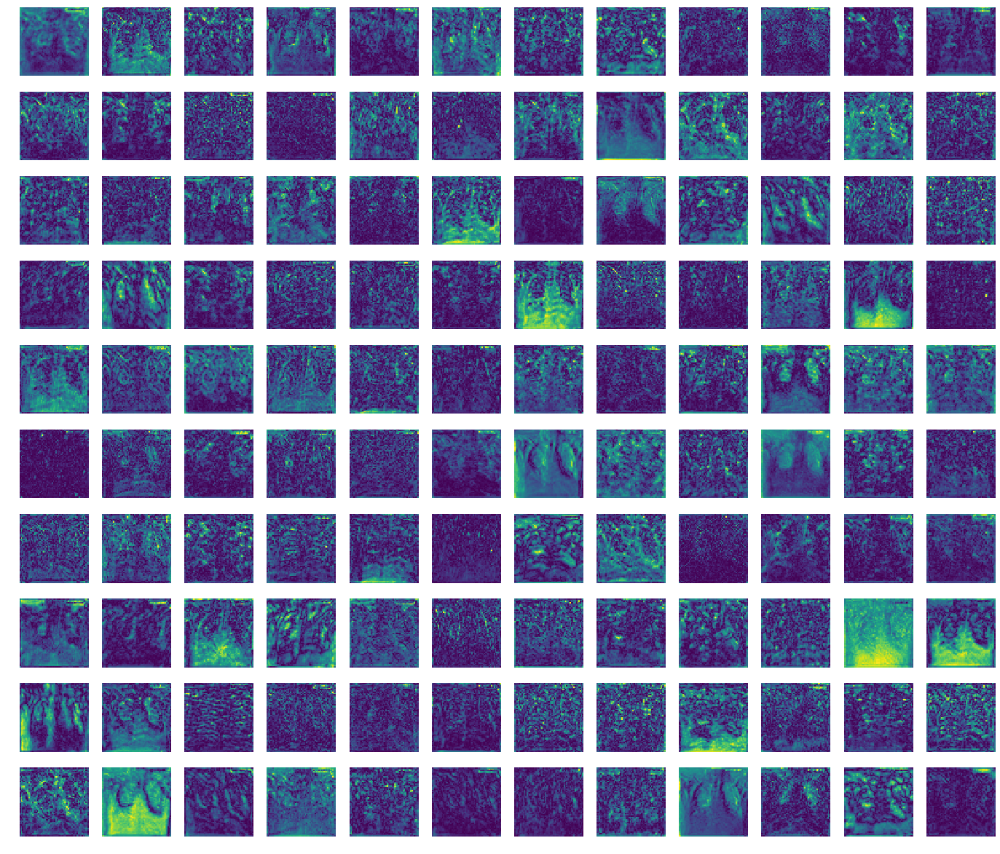

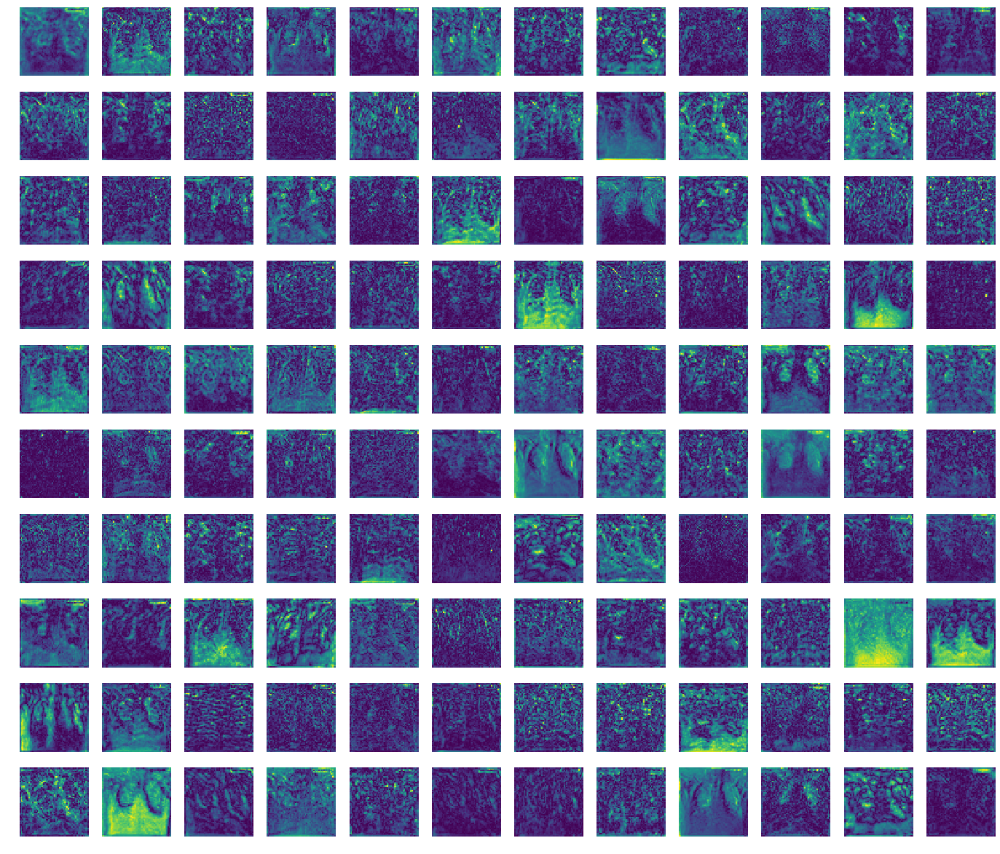

In [171]:
visualize(t1[0][0])
visualize(t2[0][0])
visualize(t3[0][0])

<h1>Visualizing Gradients

In [173]:
x = next(iter(Test))[0][0:1]  # first example only
out = model(x).cpu()

In [174]:
out.sigmoid()

tensor([[0.5080, 0.5336, 0.5068, 0.6158, 0.5062, 0.5561, 0.5390, 0.5089, 0.6145,
         0.5437, 0.6280, 0.5027, 0.5130, 0.7004]], grad_fn=<SigmoidBackward>)

<h2>For Feature Class 0</h2>

tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       requires_grad=True)


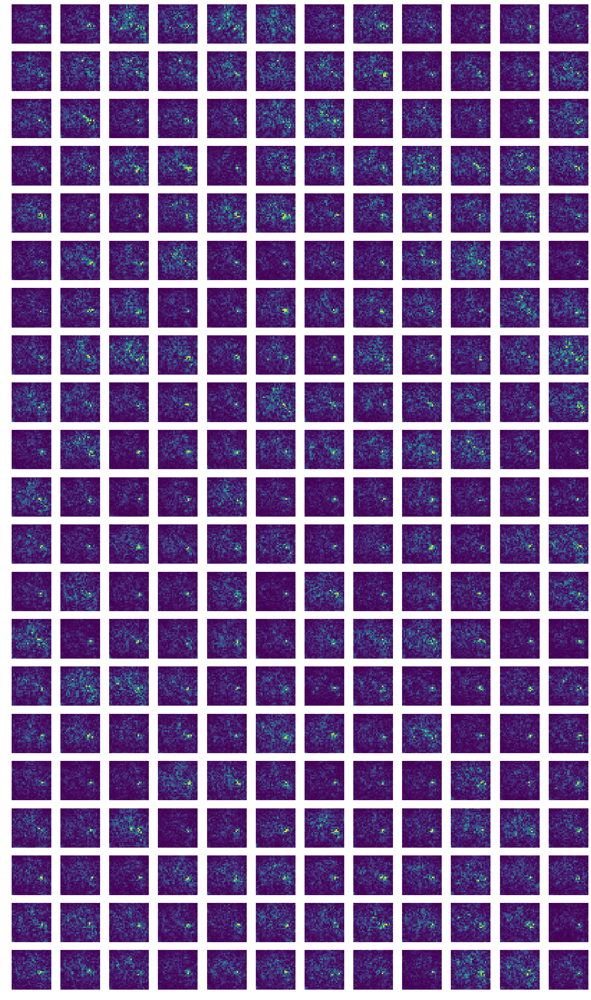

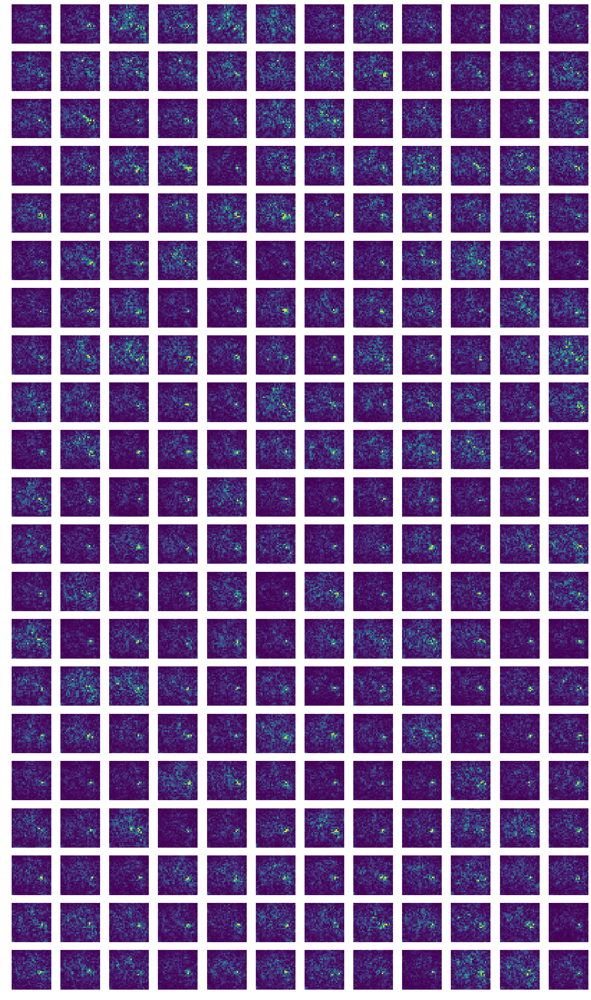

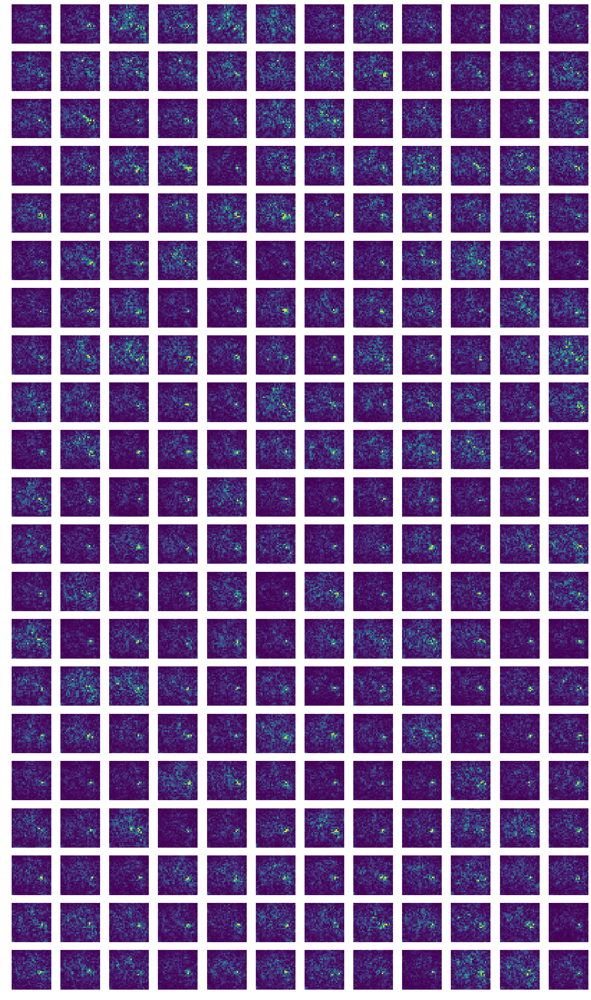

In [178]:
model.zero_grad()
one_hot = torch.tensor([1,0,0,0,0,0,0,0,0,0,0,0,0,0]).float().requires_grad_(True)
print(one_hot)
one_hot.mul(out).sum().backward(retain_graph=True)

visualize(bt1[0][0][0])
visualize(bt2[0][0][0])
visualize(bt3[0][0][0])

<h2>For Feature Class 1</h2>

tensor([0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       requires_grad=True)


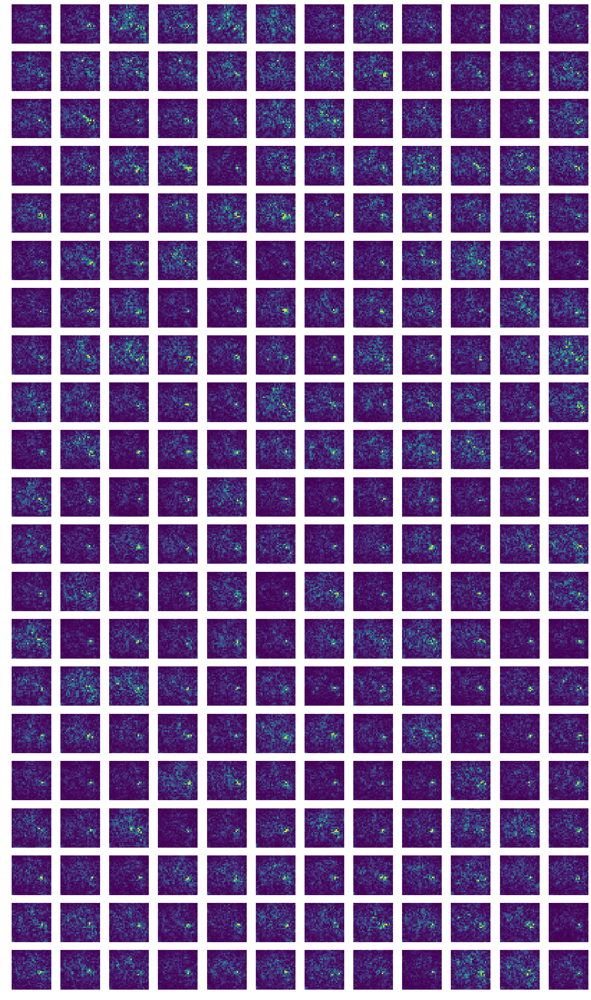

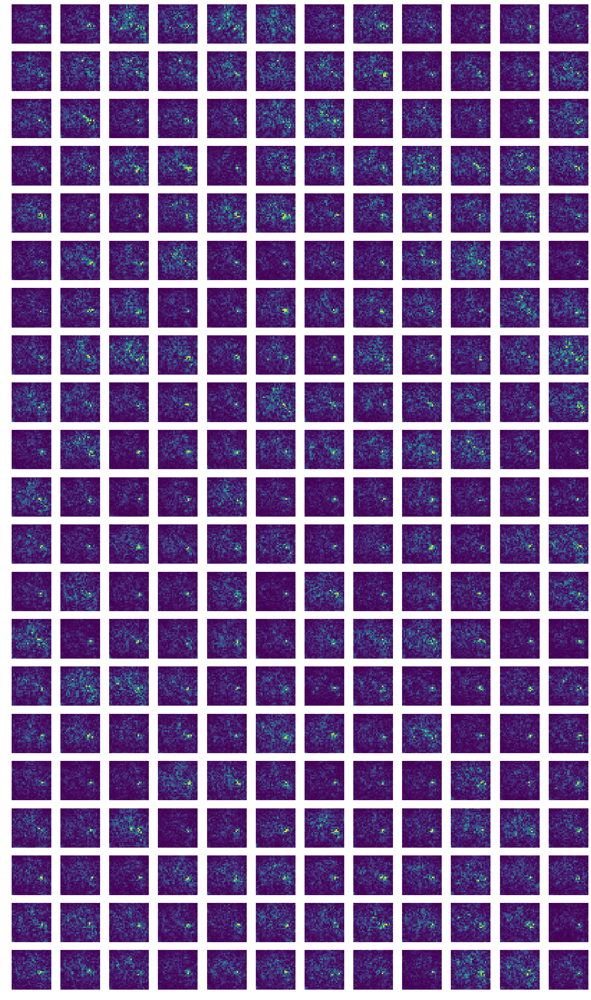

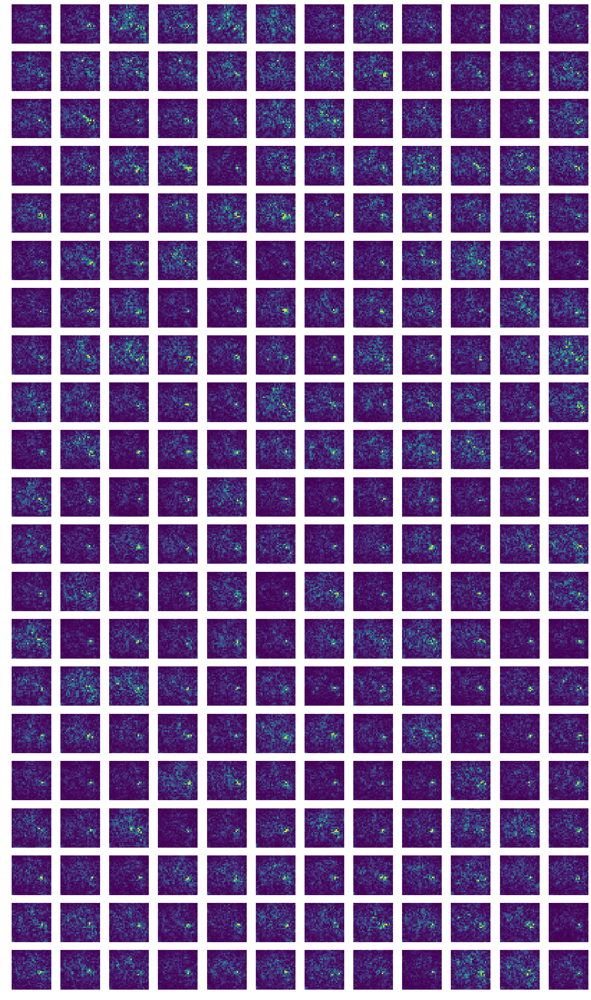

In [180]:
model.zero_grad()
one_hot = torch.tensor([0,1,0,0,0,0,0,0,0,0,0,0,0,0]).float().requires_grad_(True)
print(one_hot)
one_hot.mul(out).sum().backward(retain_graph=True)

visualize(bt1[0][0][0])
visualize(bt2[0][0][0])
visualize(bt3[0][0][0])

<h2>For Feature Class 2</h2>

tensor([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       requires_grad=True)


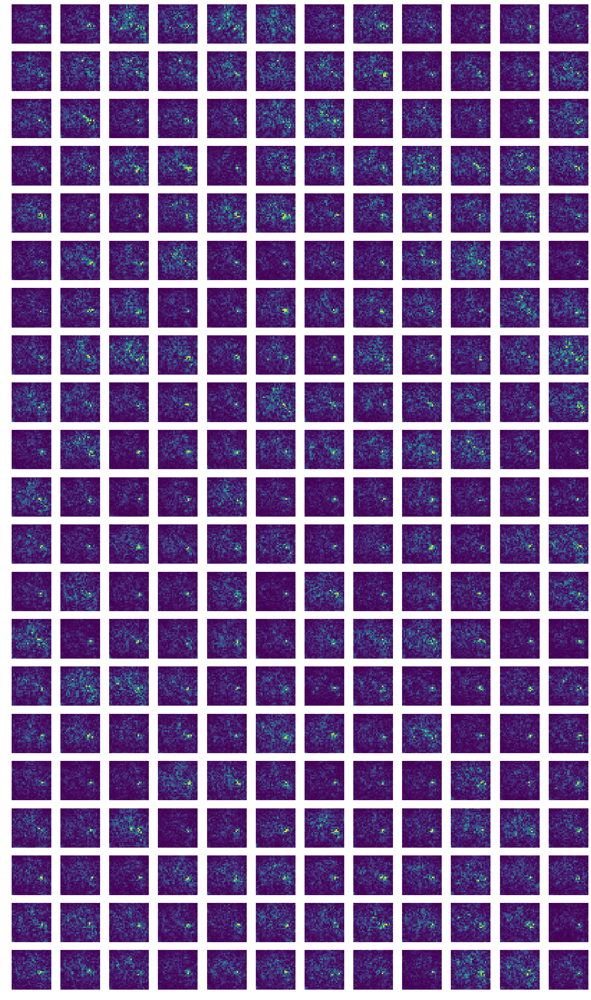

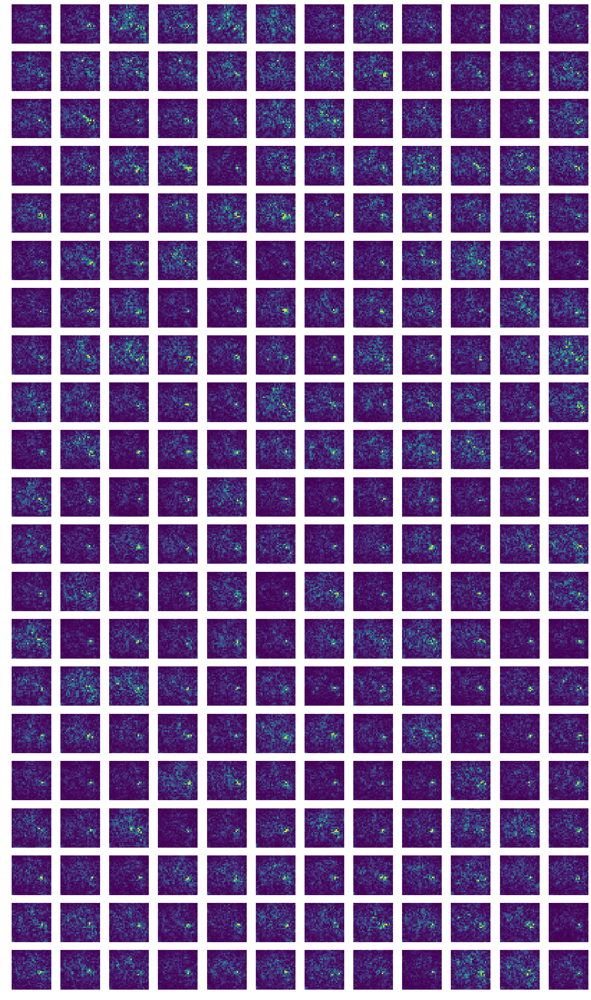

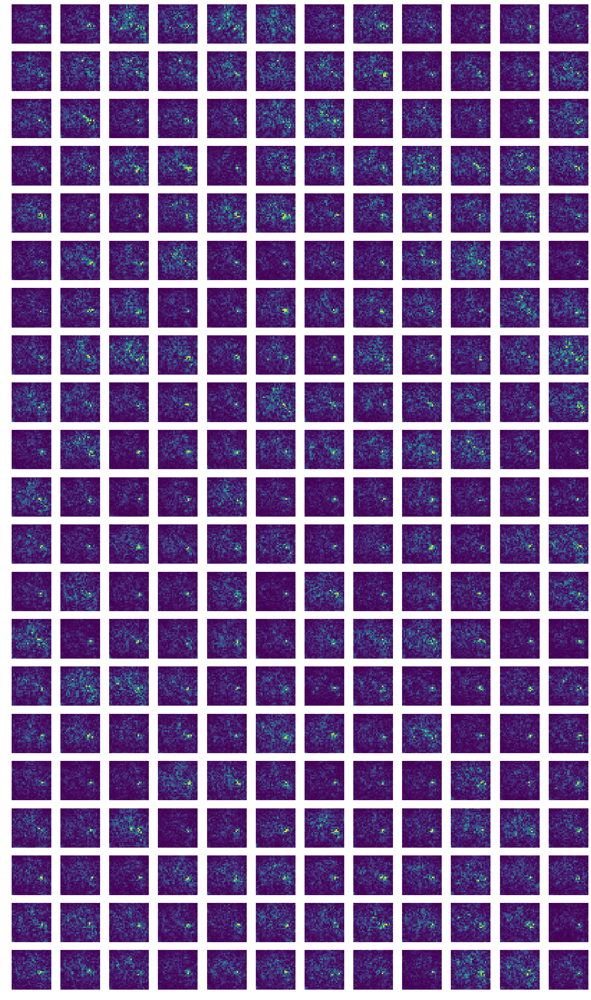

In [183]:
model.zero_grad()
one_hot = torch.tensor([0,0,1,0,0,0,0,0,0,0,0,0,0,0]).float().requires_grad_(True)
print(one_hot)
one_hot.mul(out).sum().backward(retain_graph=True)

visualize(bt1[0][0][0])
visualize(bt2[0][0][0])
visualize(bt3[0][0][0])

<h2>For Feature Class 3</h2>

tensor([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       requires_grad=True)


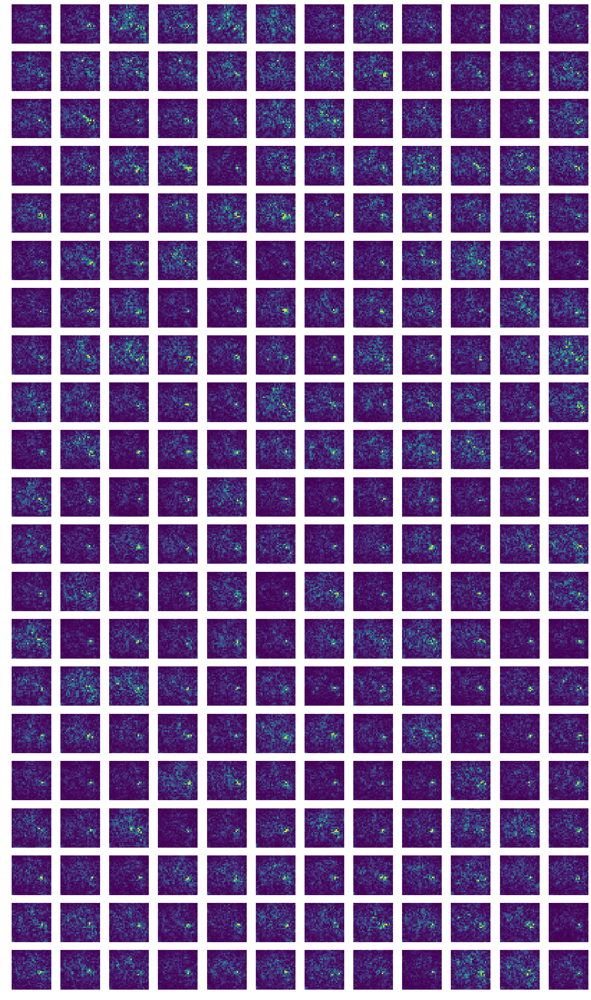

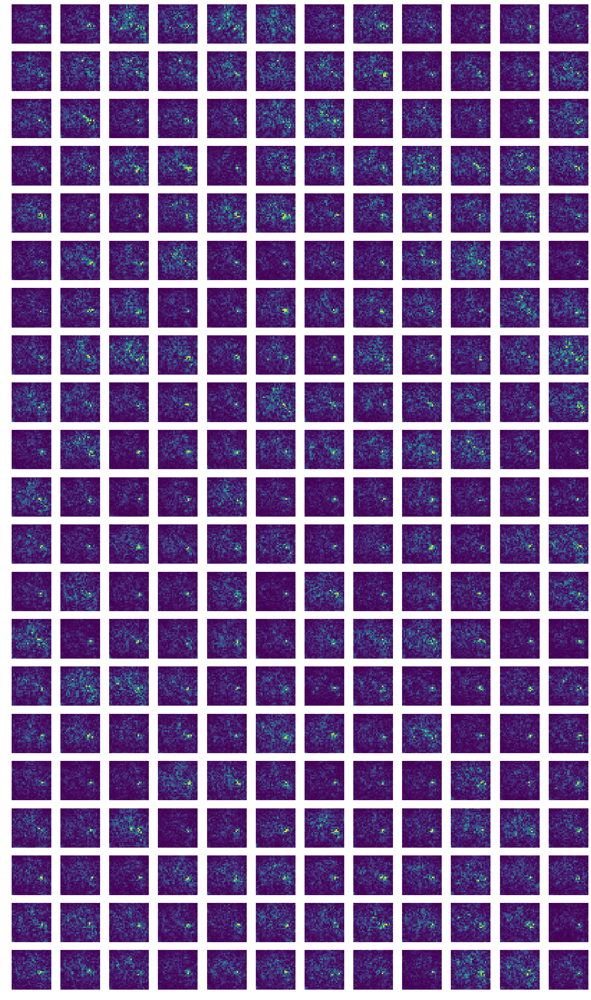

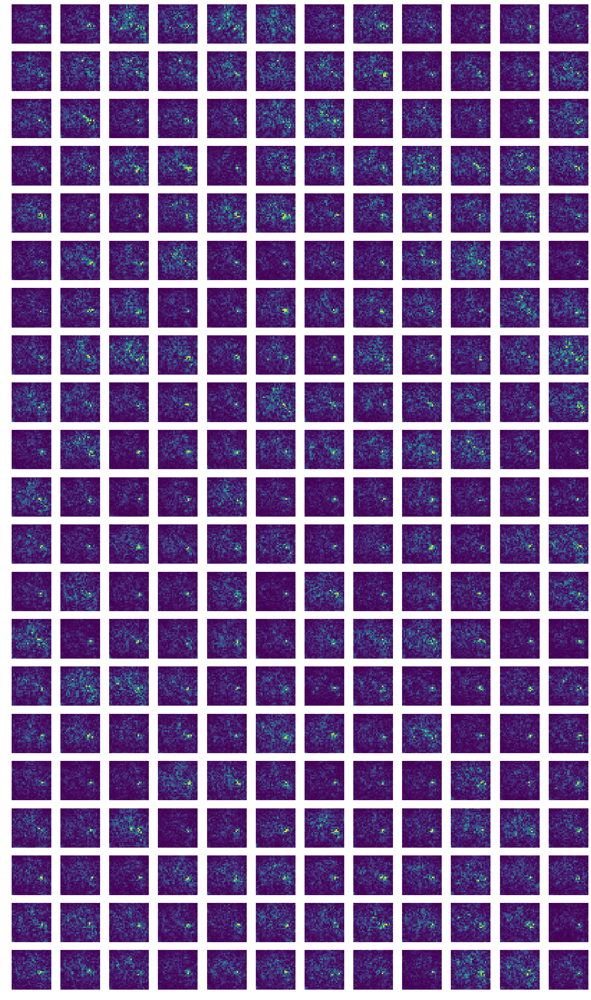

In [184]:
model.zero_grad()
one_hot = torch.tensor([0,0,0,1,0,0,0,0,0,0,0,0,0,0]).float().requires_grad_(True)
print(one_hot)
one_hot.mul(out).sum().backward(retain_graph=True)

visualize(bt1[0][0][0])
visualize(bt2[0][0][0])
visualize(bt3[0][0][0])

<h1>Function for Generating Heat Maps

In [123]:
class HeatmapGenerator ():
    def __init__ (self, pathModel, nnClassCount, transCrop):
        #Initialize the network
        model = DenseNet121(nnClassCount).cuda()
        model = torch.nn.DataParallel(model).cuda()
        modelCheckpoint = torch.load(pathModel)
        model.load_state_dict(modelCheckpoint['state_dict'])
        
        self.model = model
        self.model.eval()
        
        #Initialize the weights
        self.weights = list(self.model.module.densenet121.features.parameters())[-2]

        #Initialize the image transform
        normalize = transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        transformList = []
        transformList.append(transforms.Resize((transCrop, transCrop)))
        transformList.append(transforms.ToTensor())
        transformList.append(normalize)  
        self.transformSequence = transforms.Compose(transformList)
        
    def generate (self, pathImageFile, pathOutputFile, transCrop):
        
        #---- Load image, transform, convert 
        with torch.no_grad():
 
            imageData = Image.open(pathImageFile).convert('RGB')
            imageData = self.transformSequence(imageData)
            imageData = imageData.unsqueeze_(0)
            imageData = imageData.cuda()
            l = self.model(imageData)
            output = self.model.module.densenet121.features(imageData)
            label = class_names[torch.max(l,1)[1]]
            #---- Generate heatmap
            heatmap = None
            for i in range (0, len(self.weights)):
                map = output[0,i,:,:]
                if i == 0: heatmap = self.weights[i] * map
                else: heatmap += self.weights[i] * map
                npHeatmap = heatmap.cpu().data.numpy()

        #---- Blend original and heatmap 
        imgOriginal = cv.imread(pathImageFile, 1)
        imgOriginal = cv.resize(imgOriginal, (transCrop, transCrop))
        
        cam = npHeatmap / np.max(npHeatmap)
        cam = cv.resize(cam, (transCrop, transCrop))
        heatmap = cv.applyColorMap(np.uint8(255*cam), cv.COLORMAP_JET)
        
        img = cv.addWeighted(imgOriginal,1,heatmap,0.35,0)            
        img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
        titles = ["Real", label]
        images = [imgOriginal, img]
        for i in range(0,2):
            plt.subplot(1,2, i + 1)
            plt.title(titles[i])
            plt.imshow(images[i])

        #plt.plot()
        #plt.axis('off')
        plt.savefig(pathOutputFile)
        plt.show()

<h1>HeatMap for Class "Pleural Effusion"</h1>

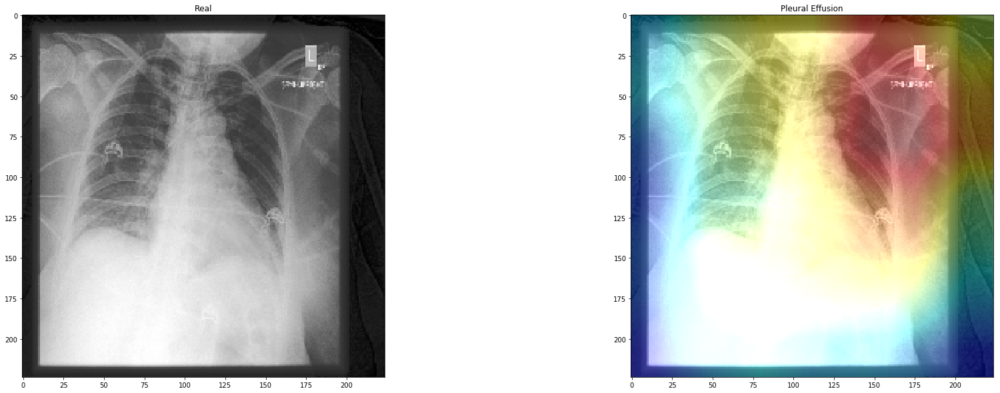

In [62]:
pathInputImage = 'CheXpert-v1.0-small/valid/patient64671/study1/view1_frontal.jpg'
pathOutputImage = 'heatmap_view1_frontal.png'
pathModel = "m-epoch2.pth.tar"


h = HeatmapGenerator(pathModel, classcount, 224)

h.generate(pathInputImage, pathOutputImage, 224)

<h1>HeatMap for Class "Support Devices"</h1>

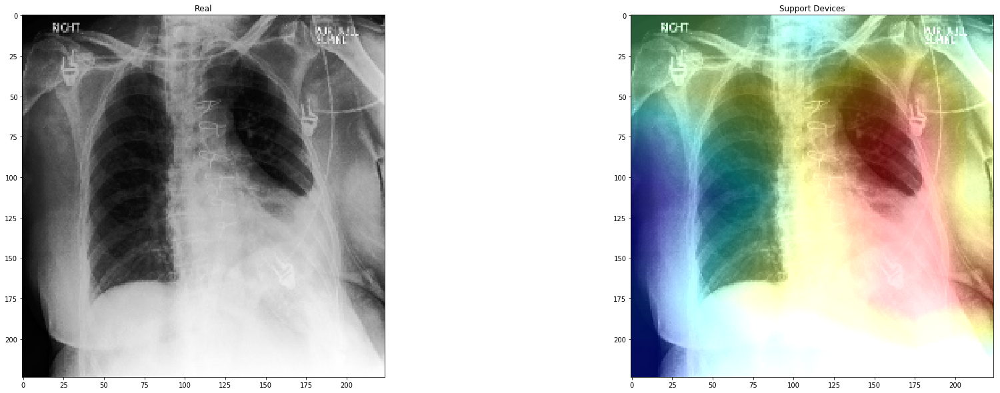

In [63]:
pathInputImage = 'CheXpert-v1.0-small/valid/patient64722/study1/view1_frontal.jpg'
pathOutputImage = 'heatmap2_view1_frontal.png'
pathModel = "m-epoch2.pth.tar"


h = HeatmapGenerator(pathModel, classcount, 224)

h.generate(pathInputImage, pathOutputImage, 224)

<h1>HeatMap for Class "No Finding"</h1>

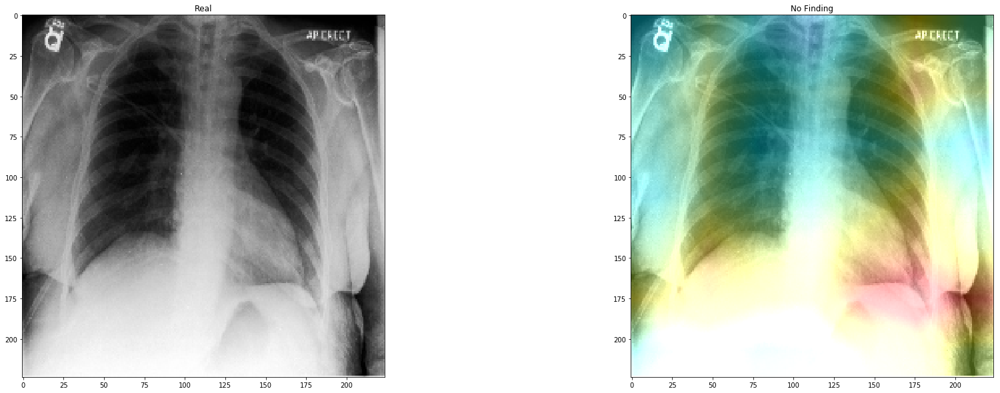

In [76]:
pathInputImage = 'CheXpert-v1.0-small/valid/patient64705/study1/view1_frontal.jpg'
pathOutputImage = 'heatmap2_view1_frontal.png'
pathModel = "m-epoch2.pth.tar"


h = HeatmapGenerator(pathModel, classcount, 224)

h.generate(pathInputImage, pathOutputImage, 224)

<h1>HeatMap for Class "Lung Opacity"</h1>

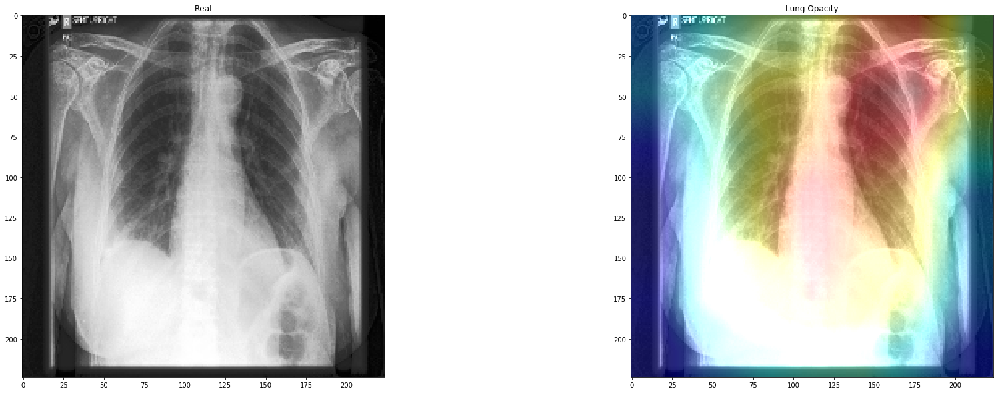

In [106]:
pathInputImage = 'CheXpert-v1.0-small/valid/patient64735/study1/view1_frontal.jpg'
pathOutputImage = 'heatmap2_view1_frontal.png'
pathModel = "m-epoch2.pth.tar"


h = HeatmapGenerator(pathModel, classcount, 224)

h.generate(pathInputImage, pathOutputImage, 224)

<h2>Conclusion : The HeatMaps Show the different activated area's for different feature Classes<br>
      